In [1]:
import os.path as osp
import torch
import vidi
import augment.transforms as at
print(vidi.__version__)

accimage found
opencv found
PIL found
0.0.8


In [2]:
Sh = at.Show()

In [3]:
vid = "/home/z/work/gans/pix2pix/results/metropolis_ccf_coloring.mov" 
if not osp.isfile(vid):
    print("find new avi, <%s> not found"%vid)

In [4]:
batch = torch.zeros([3, 3, 480, 640], dtype=torch.float32)

In [5]:
def runframes(file, start=1000,step=600, ftransform=None, data=None, debug=False, msg=""):
    print("%sftransform: %s"%(msg+" ", ftransform))
    with vidi.AVDataset(file, start=start, step=step, ftransform=ftransform, debug=False) as AV:
        for i in range(len(data)):
            data[i] = AV.__getitem__(1)
        Sh(data, ncols=3)

Normal, straight frames ftransform: None


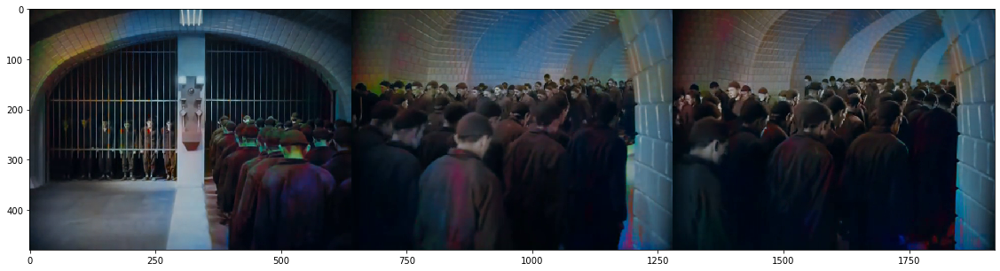

In [6]:
runframes(vid, start=1000,step=600, ftransform=None, data=batch, debug=False, msg="Normal, straight frames")

 ftransform: ['edgedetect=low=0.1:high=0.05']


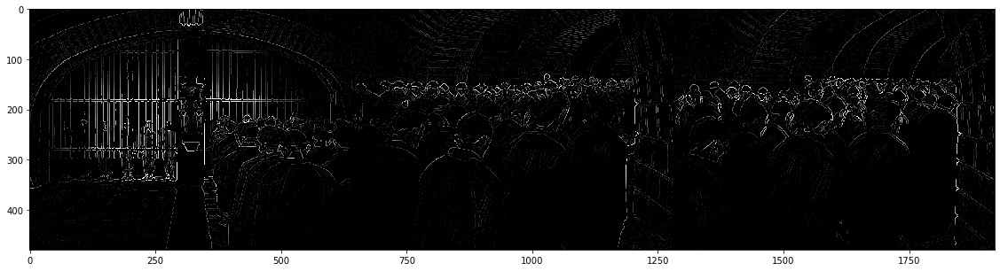

In [7]:
_e = ["edgedetect=low=0.1:high=0.05"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False)

 ftransform: ['edgedetect=low=0.1:high=0.05', 'negate']


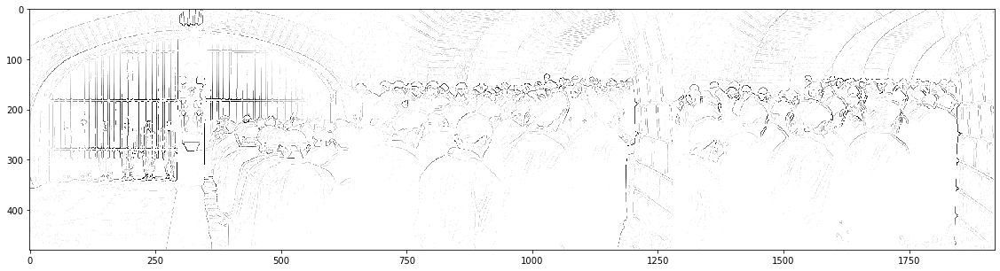

In [8]:
_e = ["edgedetect=low=0.1:high=0.05", "negate"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False)

 ftransform: ['edgedetect=mode=colormix:high=0.7', 'negate']


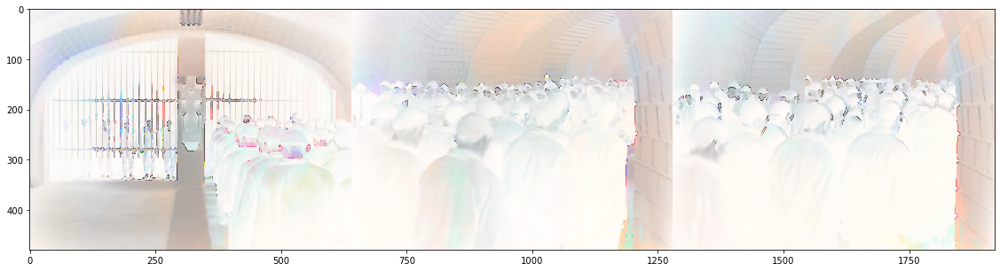

In [9]:
_e = ["edgedetect=mode=colormix:high=0.7", "negate"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False)

 ftransform: ['edgedetect=mode=canny:high=0']


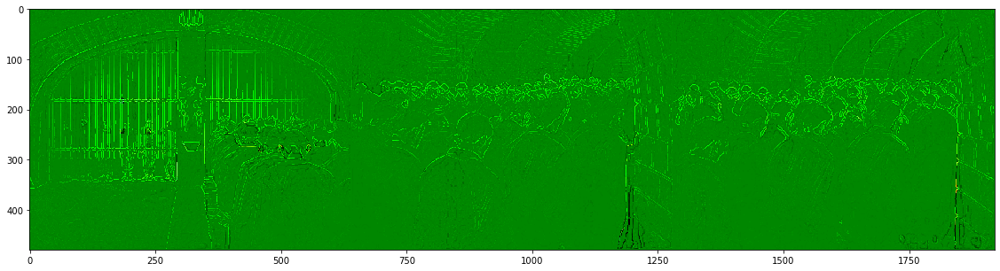

In [10]:
_e = ["edgedetect=mode=canny:high=0"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False)

Histogram Equalization ftransform: ['histeq']


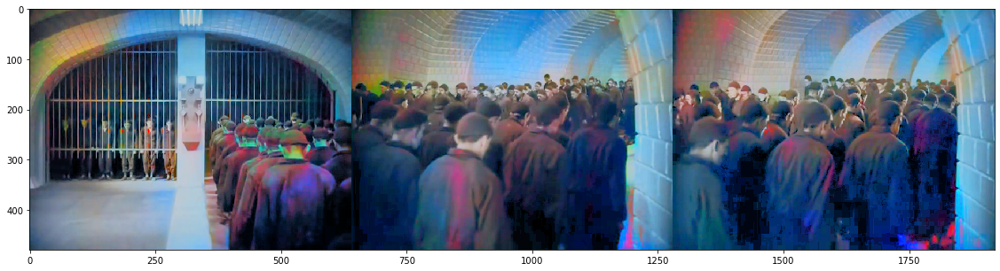

In [11]:
_e = ["histeq=strength=0.5"]#default.0.2#:intensity=.9"
_e = ["histeq=strength=0.2:intensity=.9"]# default 0.210
_e = ["histeq"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg="Histogram Equalization")

 ftransform: ['lenscorrection=cx=0.5:cy=0.5:k1=-0.7:k2=-0.7']


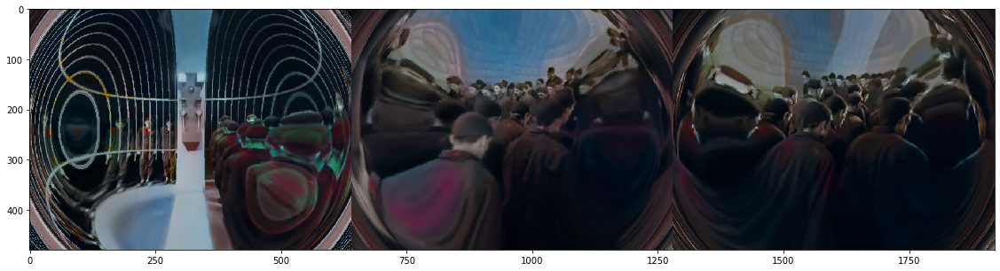

 ftransform: ['lenscorrection=cx=0.5:cy=0.5:k1=0.7:k2=0.7']


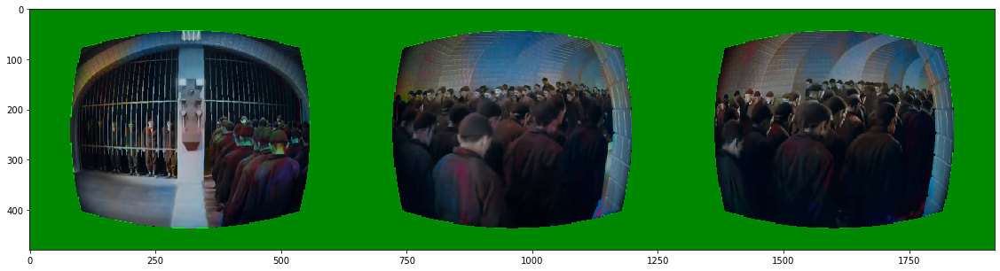

In [12]:
_e = ["lenscorrection=cx=0.5:cy=0.5:k1=-0.7:k2=-0.7"] # defaults cs=0.5 cy=0.5 k1=0.0,k2=0.0,
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False)
_e = ["lenscorrection=cx=0.5:cy=0.5:k1=0.7:k2=0.7"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False)

+RedShift Shadows ftransform: ['colorbalance=rs=.3']


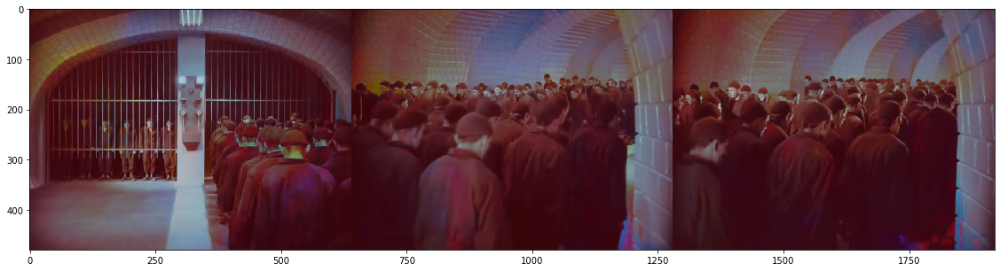

+GreenShift Highlights ftransform: ['colorbalance=gh=.5']


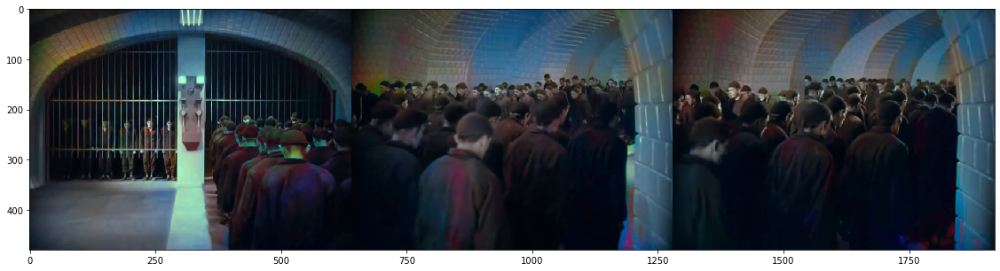

+G+RShift Midtones ftransform: ['colorbalance=gm=.5:bm=.5']


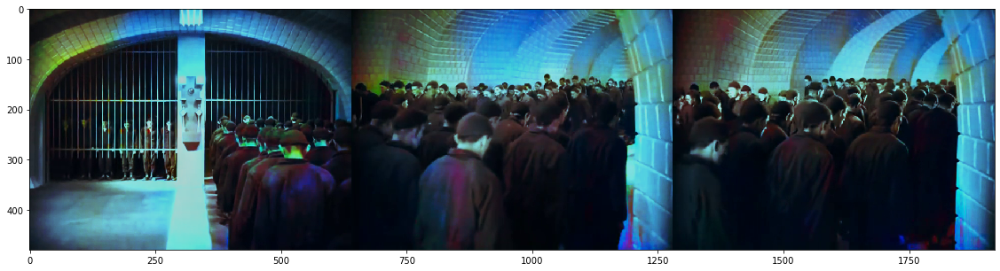

In [13]:
_e = ["colorbalance=rs=.3"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg="+RedShift Shadows")

_e = ["colorbalance=gh=.5"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg="+GreenShift Highlights")

_e = ["colorbalance=gm=.5:bm=.5"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg="+G+RShift Midtones")


Simulate Sepia ftransform: ['colorchannelmixer=.393:.769:.189:0:.349:.686:.168:0:.272:.534:.131']


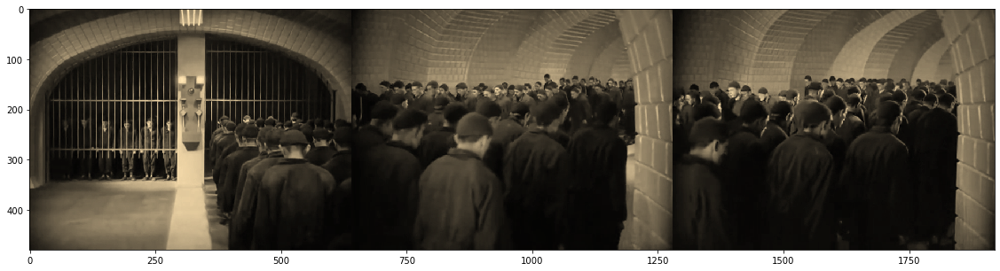

In [14]:
_e = ["colorchannelmixer=.393:.769:.189:0:.349:.686:.168:0:.272:.534:.131"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg="Simulate Sepia")

increase contrast ftransform: ['colorlevels=rimin=0.039:gimin=0.039:bimin=0.039:rimax=0.96:gimax=0.96:bimax=0.96']


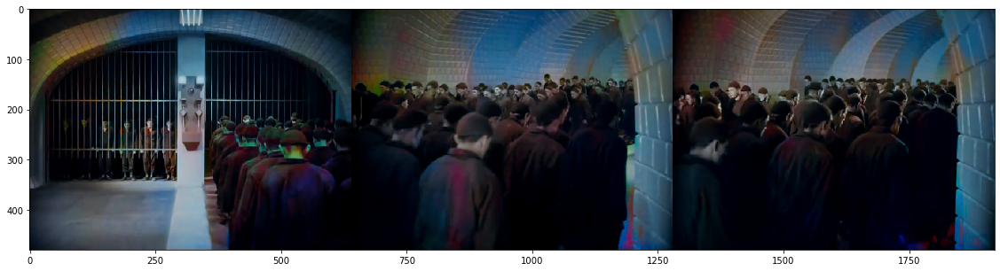

increase brightness ftransform: ['colorlevels=romin=0.5:gomin=0.5:bomin=0.5']


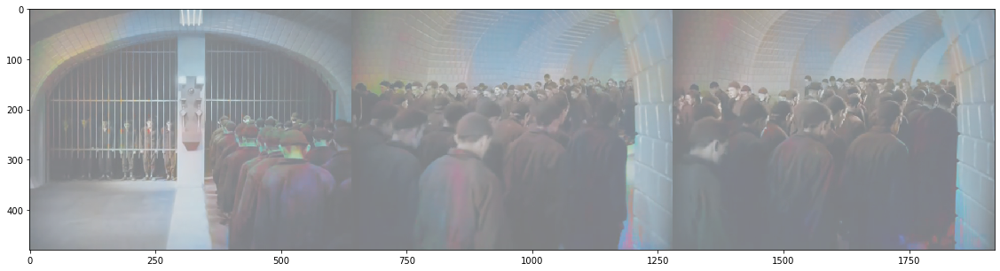

In [15]:
_e = ["colorlevels=rimin=0.039:gimin=0.039:bimin=0.039:rimax=0.96:gimax=0.96:bimax=0.96"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg="increase contrast")
_e = ["colorlevels=romin=0.5:gomin=0.5:bomin=0.5"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg="increase brightness")

apply laplacian edge detector convolution ftransform: ["convolution='1 1 1 1 -8 1 1 1 1:1 1 1 1 -8 1 1 1 1:1 1 1 1 -8 1 1 1 1:1 1 1 1 -8 1 1 1 1:5:5:5:1:0:128:128:0'"]


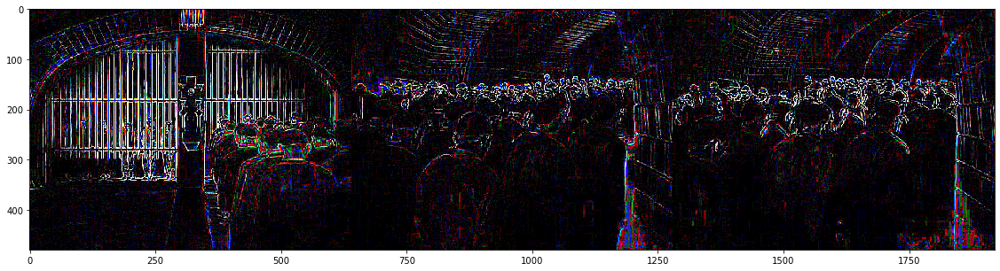

In [16]:
_e = ["convolution='1 1 1 1 -8 1 1 1 1:1 1 1 1 -8 1 1 1 1:1 1 1 1 -8 1 1 1 1:1 1 1 1 -8 1 1 1 1:5:5:5:1:0:128:128:0'"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False,
          msg="apply laplacian edge detector convolution")

curves: vintage effect ftransform: ["curves=r='0/0.11 .42/.51 1/0.95':g='0/0 0.50/0.48 1/1':b='0/0.22 .49/.44 1/0.8'"]


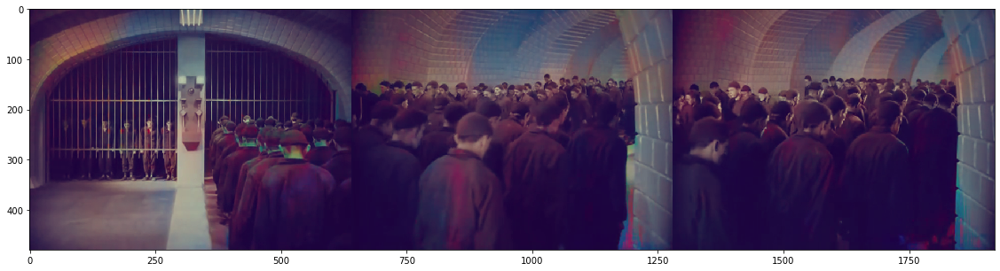

In [17]:
_e =["curves=r='0/0.11 .42/.51 1/0.95':g='0/0 0.50/0.48 1/1':b='0/0.22 .49/.44 1/0.8'"]
msg = "curves: vintage effect"
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg=msg)

 ftransform: ['gblur=sigma=6:sigmaV=0.1']


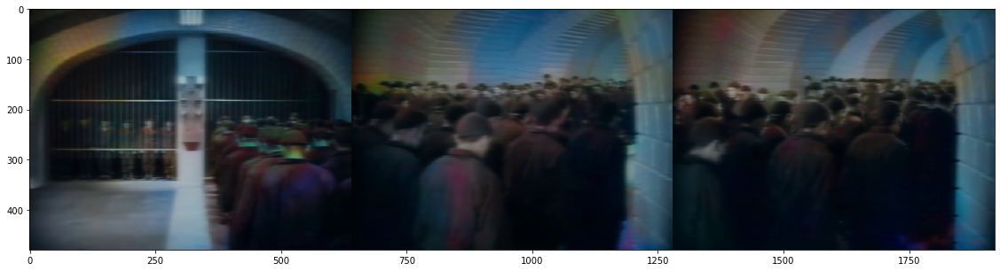

In [18]:
_e = ["gblur=sigma=6:sigmaV=0.1"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False)

fix banding artifacts ftransform: ['gradfun=radius=8']


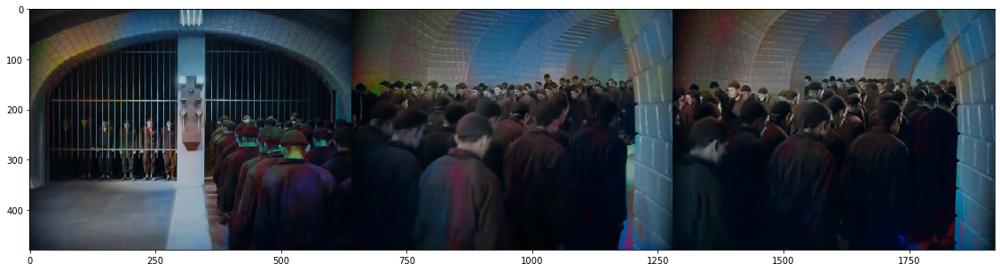

In [19]:
_e = ['gradfun=radius=8']
msg = "fix banding artifacts"
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg=msg)

grey color constancy ftransform: ['greyedge=difford=1:minknorm=5:sigma=2']


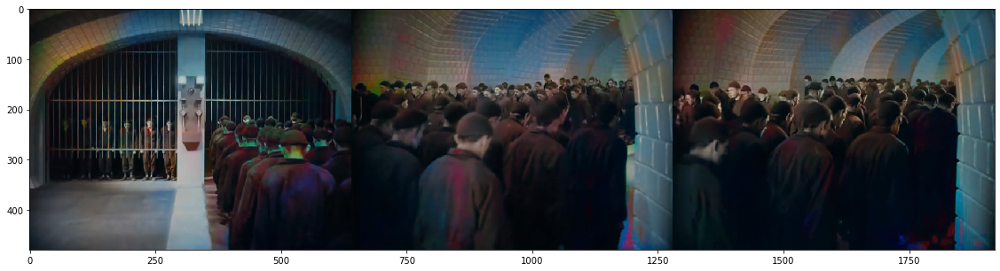

In [20]:
_e = ["greyedge=difford=1:minknorm=5:sigma=2"]
msg = "grey color constancy"
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg=msg)

grey color constancy ftransform: ['hflip']


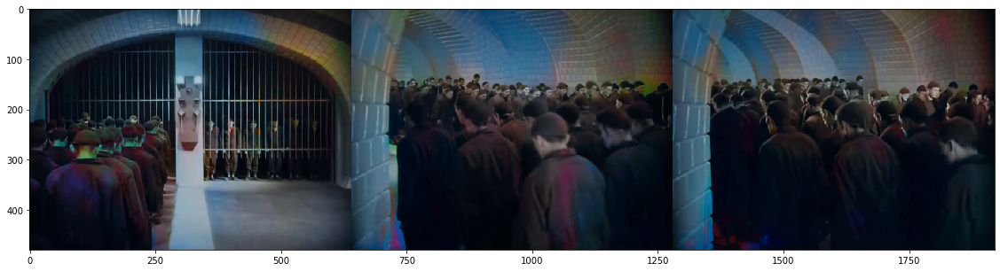

In [21]:
_e = ["hflip"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False, msg=msg)

 ftransform: ['rotate=PI/6']


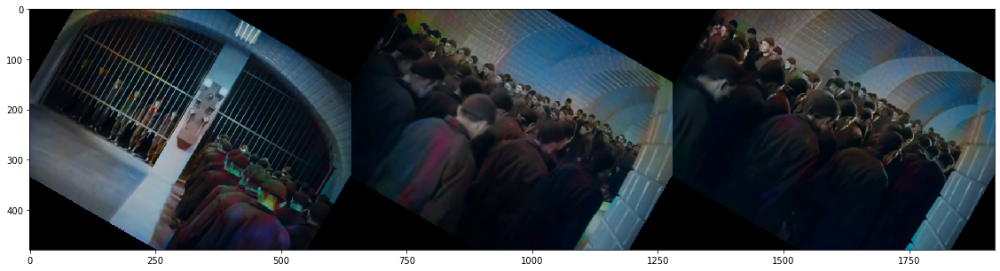

In [22]:
_e = ["rotate=PI/6"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False)

In [23]:

import numpy as np

def zoom(vid, z=1, center=(0.5,0.5)):
    """
    center [0 to 1]
    """
    stats = vidi.ffprobe(vid)
    size = np.array([stats['width'], stats['height']])
    center = np.clip(np.array(center), 0, 1)
    zsize = (size/z).astype(int)
    zoffset = ((size - zsize)* center).astype(int)
    return "crop=w=%d:h=%d:x=%d:y=%d,scale=w=%d:h=%d"%(zsize[0],zsize[1],zoffset[0],zoffset[1],size[0],size[1])

 ftransform: ['crop=w=320:h=240:x=0:y=240,scale=w=640:h=480']


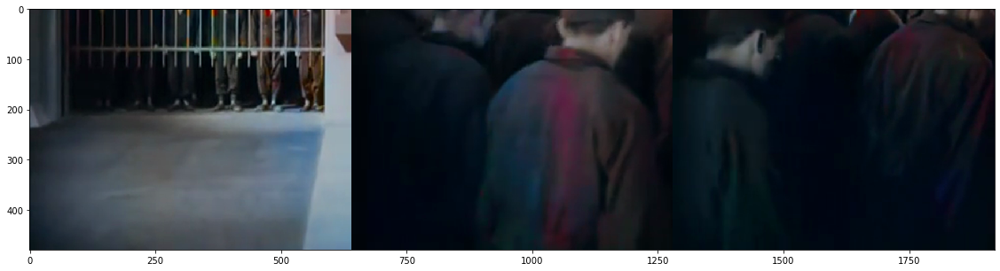

In [24]:
_e = [zoom(vid, z=2, center=(0,1))]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False)

 ftransform: ['crop=w=320:h=240:x=160:y=120', 'scale=w=640:h=480']


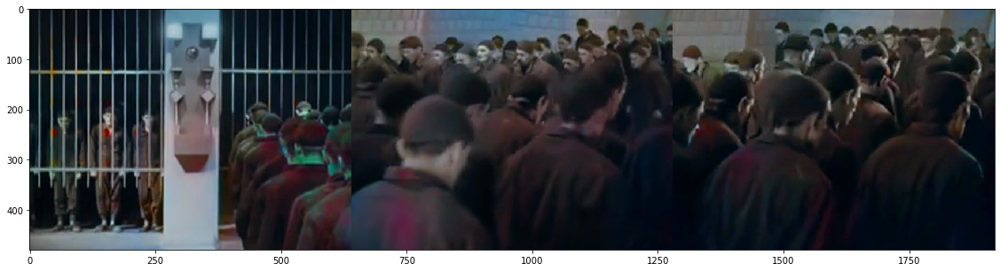

In [25]:
_e = ["crop=w=320:h=240:x=160:y=120", "scale=w=640:h=480"]
runframes(vid, start=1000,step=600, ftransform=_e, data=batch, debug=False)

ffmpeg -ss 00:44:45.086 -i /home/z/work/gans/pix2pix/results/metropolis_ccf_coloring.mov -ss 00:44:46.086 -vframes 261986 -vf framestep=600 -f image2pipe -pix_fmt rgb24 -vcodec rawvideo -


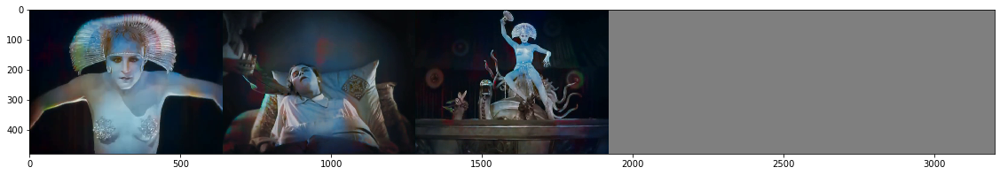

Timer: FFread('/home/z/work/gans/pix2pix/results/metropolis_ccf_coloring.mov')
 Open                                  		0.056 ms
 pipe Popen                            		11.137 ms
 :read ffmpeg frame to buffer [0]      	18036.300 ms
 :buffer to numpy [0]                  	18036.341 ms
 :built tensor [0]                     	18037.314 ms
 to torch: ready [0]                   		18037.324 ms
 :read ffmpeg frame to buffer [1]      	137.779 ms
 :buffer to numpy [1]                  	137.808 ms
 :built tensor [1]                     	153.514 ms
 to torch: ready [1]                   		153.524 ms
 :read ffmpeg frame to buffer [2]      	109.607 ms
 :buffer to numpy [2]                  	109.641 ms
 :built tensor [2]                     	111.262 ms
 to torch: ready [2]                   		111.269 ms
 pipe Popen0                           		324.293 ms
Total	                                 	18637.624 ms


In [26]:
batch = torch.zeros([3, 3, 480, 640], dtype=torch.float32)
with vidi.AVDataset(vid, start=80502, step=600, debug=True) as AV:
    for i in range(len(batch)):
        batch[i] = AV.__getitem__(1)
            
    Sh(batch, ncols=5)

ffmpeg -ss 00:03:35.950 -i /home/z/work/gans/pix2pix/results/metropolis_ccf_coloring.mov -ss 00:03:36.950 -vframes 261986 -f image2pipe -pix_fmt rgb24 -vcodec rawvideo -


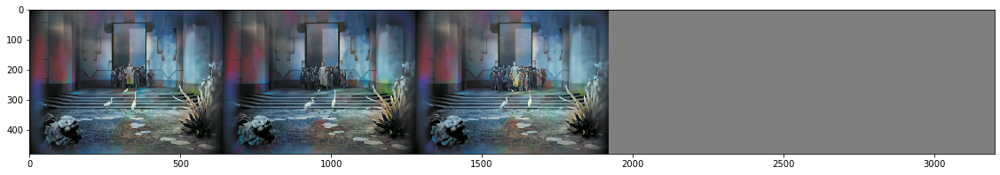

Timer: FFread('/home/z/work/gans/pix2pix/results/metropolis_ccf_coloring.mov')
 Open                                  		0.041 ms
 pipe Popen                            		12.401 ms
 :read ffmpeg frame to buffer [0]      	2575.522 ms
 :buffer to numpy [0]                  	2575.563 ms
 :built tensor [0]                     	2576.548 ms
 to torch: ready [0]                   		2576.557 ms
 :read ffmpeg frame to buffer [1]      	66.276 ms
 :buffer to numpy [1]                  	66.299 ms
 :built tensor [1]                     	67.159 ms
 to torch: ready [1]                   		67.171 ms
 :read ffmpeg frame to buffer [2]      	68.558 ms
 :buffer to numpy [2]                  	68.581 ms
 :built tensor [2]                     	69.366 ms
 to torch: ready [2]                   		69.373 ms
 pipe Popen0                           		318.542 ms
Total	                                 	3044.102 ms


In [27]:
with vidi.AVDataset(vid, start=6502, debug=True) as AV:
    for i in range(len(batch)):
        batch[i] = AV.__getitem__(100)
            
    Sh(batch, ncols=5)